# IMAGE SEGMENTATION OF CAR PARTS WITH DELOITTE CONSULTING

Halldór Gauti Pétursson, Margrét Vala Þórisdóttir, Signý Kristín Sigurjónsdóttir, Valgeir Einarsson

In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
import os
#os.chdir('/content/drive/My Drive/02456 Deep learning/Final project/')
#os.getcwd()

Mounted at /content/drive


In [2]:
## Imports

%matplotlib inline
import os
import re
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from pydantic import BaseModel
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from torch.autograd import Variable
import torchvision
from torchvision import transforms
from torchvision.utils import make_grid
from torchsummary import summary
from tqdm.notebook import tqdm
import random
import cv2
from sklearn import metrics
from sklearn.metrics import accuracy_score

## Set up

In [3]:
## Set up

# Paths
#data_path_arrays = 'carseg_data/arrays'
#backgrounds_path = 'carseg_data/landscapes_npy'
data_path_arrays = '/content/drive/My Drive/Skoli/6H/Deep Learning/Final Project/carseg_data_3/arrays_og'
backgrounds_path = '/content/drive/My Drive/Skoli/6H/Deep Learning/Final Project/carseg_data_3/landscapes_npy'

# Random seed
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

# Class label map color (assume class labels have been mapped to 0-9)
class Label(BaseModel):
    class_value: int
    color: tuple
    car_part: str

class_values = range(0, 10)
colors = [(255, 255, 255), (255, 165, 0), (0, 128, 0), (255, 255, 0), (0, 255, 255),
          (128, 0, 128), (144, 238, 144), (0, 0, 255), (255, 192, 203), (0, 0, 0)]
car_parts = ["background", "hood", "front door", "rear door", "frame", "rear quater panel", "trunk lid", "fender", "bumper", "rest of car"]
classes = [Label(class_value = cv, color=c, car_part=cp) for cv, c, cp in zip(class_values, colors, car_parts)]
class_to_color = {c.class_value : c.color for c in classes}

In [4]:
## Utlilities

def plot_image(image, grayscale=False):
    # Plots a single image on rgb 0-255 scale
    if torch.is_tensor(image):
        image = image.detach().cpu().permute((1, 2, 0)).numpy()
    with sns.axes_style("white"):
        plt.figure(figsize=(8, 8))
        cmap = 'gray' if grayscale else None
        plt.imshow(image, cmap=cmap)
        plt.axis('off')
        plt.show()


def segment_image(image, labels):
    # Segments an image based on class labels using color map
    # Returns segmented image as tensor
    if torch.is_tensor(image):
        # Convert tensor to numpy arrays
        image = image.detach().cpu().permute(1, 2, 0).numpy()
        labels = labels.detach().cpu().numpy()

    # Create (rows, cols, 3) array
    segmented_image = np.zeros(image.shape[:2]+(3,))

    # Color the pixels based on the class values
    for class_value, color in class_to_color.items():
        segmented_image[labels == class_value] = color

    # Convert to tensor
    segmented_image = torch.from_numpy(segmented_image).permute(2, 0, 1).long()

    return segmented_image

def plot_grid_segmented_images(images, labels, nrow, grayscale=False):
    # Plots a grid of segmented images (tensors)
    segmented_images = []
    for image, label in zip(images, labels):
        segmented_image = segment_image(image, label)
        segmented_images.append(segmented_image)

    plot_image(torchvision.utils.make_grid(segmented_images, nrow=nrow), grayscale=grayscale)


## Data

In [5]:
## Transform images

grayscale = False
skip_rest_of_car = False
image_size = (256,256)

def add_gaussian_noise(image, mean=0, std=0.4):
    # Adding gaussian noise to image on scale [0, 1]
    noise = np.random.normal(mean, std, image.shape).astype(np.uint8)
    noisy_image = cv2.add(image, noise)

    return noisy_image


def adjust_brightness_contrast(image, brightness_factor=0.2, contrast_factor=0.2):
    # Adjust brightness and contrast using OpenCV
    image = cv2.convertScaleAbs(image, alpha=1 + brightness_factor, beta=0)
    image = cv2.addWeighted(image, 1 + contrast_factor, np.zeros_like(image), 0, 0)

    return image


def transform(image, label):
    # Function to transform data (training and testing)

    #image = adjust_brightness_contrast(image)

    # Convert to grayscale and add channel dimension
    if grayscale:
        image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        image = np.expand_dims(image, axis=-1)

    return image, label


def augment(image, label):
    # Function to augment data (training data)

    # # Add gaussian noise to image
    # image = add_gaussian_noise(image)

    # # Randomly scale the image and label
    # scale_x = random.uniform(1.0, 1.2)
    # scale_y = random.uniform(1.0, 1.2)
    # image = cv2.resize(image, None, fx=scale_x, fy=scale_y, interpolation=cv2.INTER_LINEAR)
    # label = cv2.resize(label, None, fx=scale_x, fy=scale_y, interpolation=cv2.INTER_NEAREST)

    # # Randomly crop the image and label
    # final_shape = image_size
    # rows, cols = image.shape[:2]
    # x = random.randint(0, cols - final_shape[1])
    # y = random.randint(0, rows - final_shape[0])
    # image = image[y:y + final_shape[0], x:x + final_shape[1]]
    # label = label[y:y + final_shape[0], x:x + final_shape[1]]

    # # Randomly adjust the color of the image
    # if not grayscale:
    #     r_adjust = random.uniform(0.5, 1.5)
    #     g_adjust = random.uniform(0.5, 1.5)
    #     b_adjust = random.uniform(0.5, 1.5)
    #     image[:, :, 0] = image[:, :, 0] * r_adjust
    #     image[:, :, 1] = image[:, :, 1] * g_adjust
    #     image[:, :, 2] = image[:, :, 2] * b_adjust
    #     image[image > 255] = 255
    #     image[image < 0] = 0

    # Flip the image and label horizontally with a 50% chance
    if random.choice([True, False]):
        image = cv2.flip(image, 1)  # Horizontal flip
        label = cv2.flip(label, 1)  # Horizontal flip for label

    # # Flip the image and label vertically with a 50% chance
    # if random.choice([True, False]):
    #     image = cv2.flip(image, 0)  # Vertical flip
    #     label = cv2.flip(label, 0)  # Vertical flip for label

    # Rotate the image and label slightly (up to +/- 15 degrees)
    angle = random.uniform(-15, 15)
    rows, cols = image.shape[:2]
    rotation_matrix = cv2.getRotationMatrix2D((cols / 2, rows / 2), angle, 1)
    image = cv2.warpAffine(image, rotation_matrix, (cols, rows), flags=cv2.INTER_LINEAR)
    label = cv2.warpAffine(label, rotation_matrix, (cols, rows), flags=cv2.INTER_NEAREST)

    return image, label


def add_background(image, mask):
    # Function that adds a random background to an image with mask
    background_file = f"{random.randint(1, 400)}.npy"
    background = np.load(os.path.join(backgrounds_path, background_file))
    background_pixels = (mask == 0)
    image[background_pixels] = background[background_pixels]

    return image


def remove_rest_of_car(labelled_image):
    # Enables us to remove rest of the car label
    rest_of_car_label = 9
    labelled_image[labelled_image == rest_of_car_label] = 0

    return labelled_image


In [6]:
## Segmented image data

num_real_duplicates = 28   # number of copy's of real images
test_idx = np.arange(1,31)
test_ids = [f"photo_00{i:02d}.npy" for i in test_idx]
real_image_pattern = re.compile(r'.*photo.*')
black_cad_pattern = re.compile(r'.*black.*')
orange_cad_pattern = re.compile(r'.*orange.*')

class SegmentedImageDataset(TensorDataset):
    def __init__(self, data_folder_arrays, train, transform=None):
        self.data_folder = data_folder_arrays
        self.data_files = os.listdir(data_folder_arrays)
        self.real_single = []
        self.real_duplicates = []
        self.black = []
        self.orange = []
        self.train = train
        self.transform = transform
        if self.train:
            # Exclude the test filenames to create the training dataset
            self.data_files = [file for file in self.data_files if file not in test_ids]
            # All real images of cars
            self.real_single = [file for file in self.data_files if real_image_pattern.match(file)]
            self.real_duplicates = []
            # Create num_real_dupclicates duplicates of the real images (to balance dataset but then will be augmented)
            for i in range(num_real_duplicates):
                self.real_duplicates.extend(self.real_single)
            self.black = [file for file in self.data_files if black_cad_pattern.match(file)]
            self.orange = [file for file in self.data_files if orange_cad_pattern.match(file)]
            # Concatenate
            self.data_files = self.real_duplicates + self.black + self.orange
        else:
            # Include only the test filenames for the test dataset
            self.data_files = [file for file in self.data_files if file in test_ids]

    def __len__(self):
        return len(self.data_files)

    def __getitem__(self, idx):
        file_name = os.path.join(self.data_folder, self.data_files[idx])
        image_data = np.load(file_name)
        image = image_data[:,:,:3]
        class_labels = image_data[:,:,3]
        class_labels = class_labels//10   # map class labels to 0-9
        # Add random background to image in train dataset
        if self.train:
            image = add_background(image, class_labels)
        # Augment (training data)
        if self.train:
            image, class_labels = augment(image, class_labels)
        # Transform (all data)
        if self.transform:
            image, class_labels = self.transform(image, class_labels)

        # min-max normalization for the image
        image = (image - np.min(image)) / (np.max(image) - np.min(image))

        if skip_rest_of_car:
            class_labels = remove_rest_of_car(class_labels)

        return torch.from_numpy(image).permute(2, 0, 1).float(), torch.tensor(class_labels).long()

    def split_train_validation(self, validation_split):
        # Function to split data into training and validation sets
        num_val_samples_real_single = int(validation_split*len(self.real_single))
        num_val_samples_black = int(validation_split*len(self.black))
        num_val_samples_orange = int(validation_split*len(self.orange))

        random.shuffle(self.real_single)
        random.shuffle(self.black)
        random.shuffle(self.orange)

        # Need to make sure that we don't take duplicates for train and validation (because we are making copy's of real images)
        real_train_file_unique = self.real_single[:-num_val_samples_real_single]
        real_val_file_unique = self.real_single[-num_val_samples_real_single:]
        real_train = [file for file in self.real_duplicates if file in real_train_file_unique]
        real_val = [file for file in self.real_duplicates if file in real_val_file_unique]
        # Same for CAD images (since we can't just split the self.data_files list anymore)
        black_train_file_unique = self.black[:-num_val_samples_black]
        black_val_file_unique = self.black[-num_val_samples_black:]
        black_train = [file for file in self.black if file in black_train_file_unique]
        black_val = [file for file in self.black if file in black_val_file_unique]
        orange_train_file_unique = self.orange[:-num_val_samples_orange]
        orange_val_file_unique = self.orange[-num_val_samples_orange:]
        orange_train = [file for file in self.orange if file in orange_train_file_unique]
        orange_val = [file for file in self.orange if file in orange_val_file_unique]

        return real_train+black_train+orange_train, real_val+black_val+orange_val


batch_size = 16
num_workers = 8
validation_split = 0.1

train_dataset = SegmentedImageDataset(data_folder_arrays=data_path_arrays, train=True, transform=transform)
validation_dataset = SegmentedImageDataset(data_folder_arrays=data_path_arrays, train=True, transform=transform)
test_dataset = SegmentedImageDataset(data_folder_arrays=data_path_arrays, train=False, transform=transform)
train_dataset.data_files, validation_dataset.data_files = train_dataset.split_train_validation(validation_split)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
validation_dataloader = DataLoader(validation_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
test_dataloader = DataLoader(test_dataset, batch_size=30, shuffle=False, num_workers=num_workers)

In [7]:
print(len(train_dataset))
print(len(validation_dataset))
print(len(test_dataset))

6052
647
30


Training data:


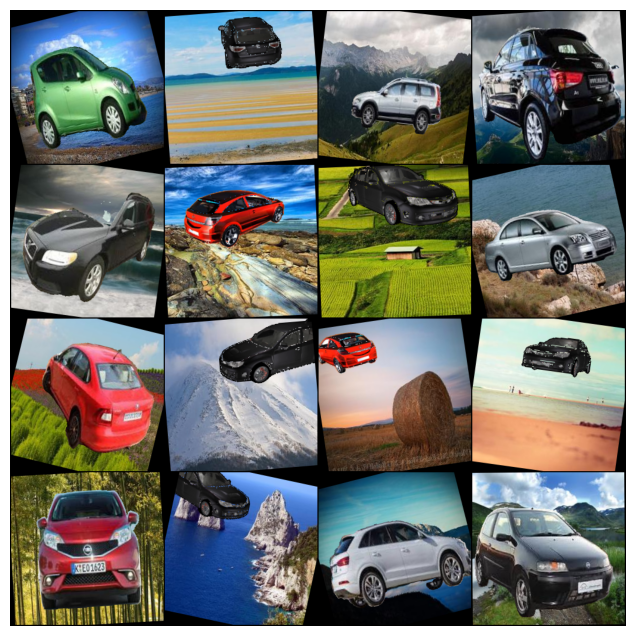

Validation data:


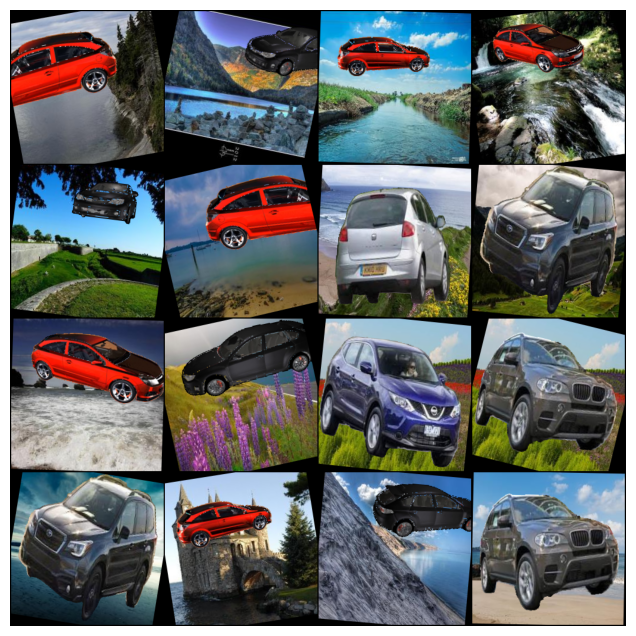

Testing data:


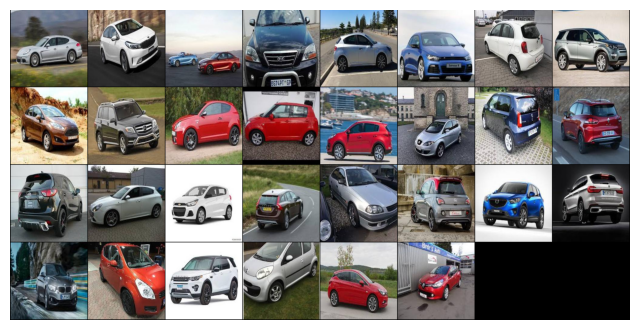

In [8]:
print('Training data:')
images_train, masks_train = next(iter(train_dataloader))
plot_image(torchvision.utils.make_grid(images_train, nrow=4), grayscale=grayscale)

print('Validation data:')
images_val, masks_val = next(iter(validation_dataloader))
plot_image(torchvision.utils.make_grid(images_val, nrow=4), grayscale=grayscale)

print('Testing data:')
images_test, masks_test = next(iter(test_dataloader))
plot_image(torchvision.utils.make_grid(images_test, nrow=8), grayscale=grayscale)

Training data:


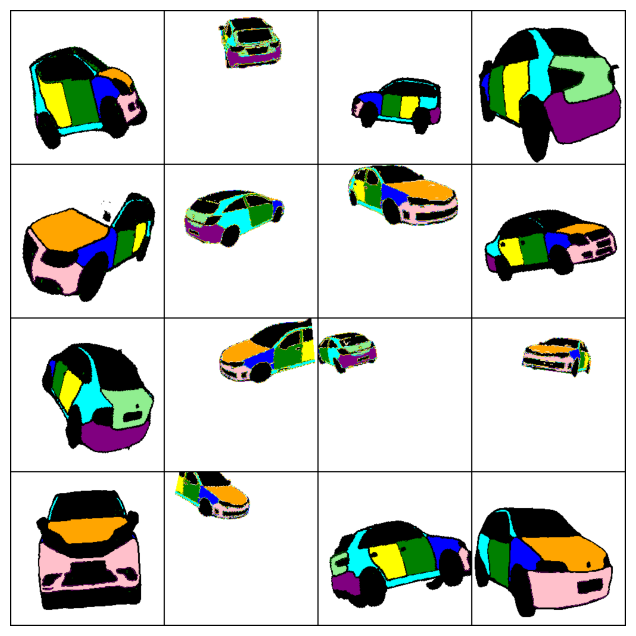

Validation data:


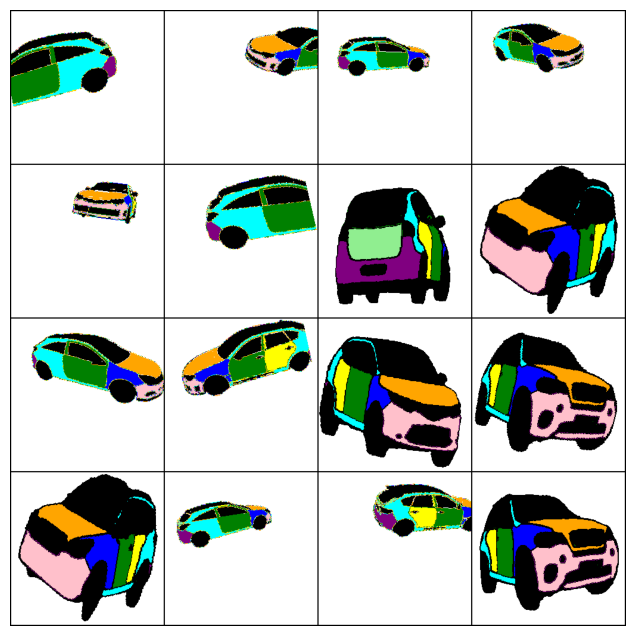

Testing data:


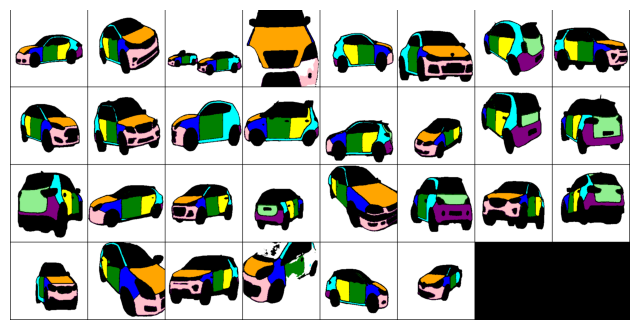

In [9]:
print('Training data:')
plot_grid_segmented_images(images_train, masks_train, nrow=4)

print('Validation data:')
plot_grid_segmented_images(images_val, masks_val, nrow=4)

print('Testing data:')
plot_grid_segmented_images(images_test, masks_test, nrow=8)

## Model and model configuration

In [10]:
## Model configuration

# Constants
num_classes = 9 if skip_rest_of_car else 10
num_channels = 1 if grayscale else 3
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [11]:
## Model

class UNet(nn.Module):
    def __init__(self, in_channels, out_channels, dropout_p=0.5):
        super(UNet, self).__init__()

        # Contracting path
        self.enc1 = self.conv_block(in_channels, 64)
        self.enc2 = self.conv_block(64, 128)
        self.enc3 = self.conv_block(128, 256)
        self.enc4 = self.conv_block(256, 512)

        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Bottleneck
        self.bottleneck = self.conv_block(512, 1024)

        # Expanding path
        self.up1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec1 = self.conv_block(1024, 512)
        self.up2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec2 = self.conv_block(512, 256)
        self.up3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec3 = self.conv_block(256, 128)
        self.up4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec4 = self.conv_block(128, 64)

        # Dropout
        self.dropout1 = nn.Dropout(dropout_p)
        self.dropout2 = nn.Dropout(dropout_p)
        self.dropout3 = nn.Dropout(dropout_p)

        self.out = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward(self, x):
        # Contracting path
        c1 = self.enc1(x)
        p1 = self.pool(c1)
        p1 = self.dropout1(p1)

        c2 = self.enc2(p1)
        p2 = self.pool(c2)
        p2 = self.dropout1(p2)

        c3 = self.enc3(p2)
        p3 = self.pool(c3)
        p3 = self.dropout1(p3)

        c4 = self.enc4(p3)
        p4 = self.pool(c4)
        p4 = self.dropout1(p4)

        # Bottleneck
        bottleneck = self.bottleneck(p4)

        # Expanding path
        up1 = self.up1(bottleneck)
        merge1 = torch.cat([up1, c4], dim=1)
        d1 = self.dec1(merge1)
        d1 = self.dropout1(d1)


        up2 = self.up2(d1)
        merge2 = torch.cat([up2, c3], dim=1)
        d2 = self.dec2(merge2)
        d2 = self.dropout1(d2)

        up3 = self.up3(d2)
        merge3 = torch.cat([up3, c2], dim=1)
        d3 = self.dec3(merge3)
        d3 = self.dropout1(d3)

        up4 = self.up4(d3)
        merge4 = torch.cat([up4, c1], dim=1)
        d4 = self.dec4(merge4)
        d4 = self.dropout1(d4)

        out = self.out(d4)
        return out

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )


In [12]:
model = UNet(in_channels=3, out_channels=10)
model.to(device)
summary(model, (3, 256, 256))   # input is an 256x256 rgb image

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
              ReLU-2         [-1, 64, 256, 256]               0
            Conv2d-3         [-1, 64, 256, 256]          36,928
              ReLU-4         [-1, 64, 256, 256]               0
         MaxPool2d-5         [-1, 64, 128, 128]               0
           Dropout-6         [-1, 64, 128, 128]               0
            Conv2d-7        [-1, 128, 128, 128]          73,856
              ReLU-8        [-1, 128, 128, 128]               0
            Conv2d-9        [-1, 128, 128, 128]         147,584
             ReLU-10        [-1, 128, 128, 128]               0
        MaxPool2d-11          [-1, 128, 64, 64]               0
          Dropout-12          [-1, 128, 64, 64]               0
           Conv2d-13          [-1, 256, 64, 64]         295,168
             ReLU-14          [-1, 256,

In [13]:
# Class weights
def calculate_class_weights(num_classes=10):
    # Function to calculate class weights as inverse of class frequency of training data samples

    # Calculate fractions -> weights
    fractions = {c: np.array([]) for c in range(0,num_classes)}   # use num_classes if we decide to skip rest of the car
    pixels_per_img = image_size[0]*image_size[1]

    # Process each image in train dataset
    for images, masks in train_dataloader:
        images = images.detach().cpu().numpy()
        masks = masks.detach().cpu().numpy()
        for image, mask in zip(images, masks):
            # Calculate the fraction for each segment in the current image
            for segment in range(0,num_classes):
                segment_pixels = np.sum(mask == segment)
                fraction = segment_pixels / pixels_per_img
                # Append the fraction to the list for the segment
                fractions[segment] = np.append(fractions[segment], fraction)

    # Now 'fractions' contains an array of fractions for each segment across all images
    average_fractions = np.zeros(num_classes)

    for segment, fraction_array in fractions.items():
        average_fractions[segment] = np.mean(fraction_array)

    # Get weigths from fractions
    inv_fractions = 1/average_fractions
    inv_fractions = inv_fractions/sum(inv_fractions)   # normalize weights

    return inv_fractions


weights = calculate_class_weights(num_classes)
print(weights)
class_weights = torch.tensor(weights,device=device).float()

[0.00265678 0.0691942  0.06694066 0.14829984 0.09960442 0.13471367
 0.24560967 0.14839346 0.07295367 0.01163364]


In [14]:
# Custom loss functions

# Inputs: Masks logistics of size (B, C, H, W), where B is batch size, C is number of channels, H is height of image mask, W is width of image mask
# Targets: Masks ground truth of size (B, H, W)

class FocalLoss(nn.Module):
    # Implementation of weighted Focal Loss

    def __init__(self, weight=None,
                 gamma=2., reduction='mean'):
        nn.Module.__init__(self)
        self.weight = weight
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, input_tensor, target_tensor):
        log_prob = F.log_softmax(input_tensor, dim=-1)
        prob = torch.exp(log_prob)
        return F.nll_loss(
            ((1 - prob) ** self.gamma) * log_prob,
            target_tensor,
            weight=self.weight,
            reduction = self.reduction
        )

# Bi-tempered Loss
import sys
sys.path.append(os.path.join('/content/drive/My Drive/Skoli/6H/Deep Learning/Final Project/github/Halldor'))
from bi_tempered_loss import *


In [15]:
# Model metric - dice score

def dice_coefficient(preds, targets, num_classes=num_classes):
    # Calculates dice score for each class
    dice = np.zeros(num_classes)
    for class_id in range(num_classes):
        pred = (preds == class_id).float()
        target = (targets == class_id).float()
        intersect = (pred * target).sum()
        union = pred.sum() + target.sum()
        if target.sum()>10:
          dice[class_id] = (2. * intersect + 1e-6) / (union + 1e-6)
        else:
          dice[class_id] = np.nan
    return dice

## Training

In [16]:
## Train

# Bi tempered loss hyperparameters
labels = 0.001   #label_smoothing: Label smoothing parameter between [0, 1)
t1 =  0.85    #t1: Temperature 1 (< 1.0 for boundedness), lower number -> less confident model, preventing overfitting
t2 = 1.3        #t2: Temperature 2 (> 1.0 for tail heaviness, < 1.0 for finite support) hihgher number -> more robust to outliers in data

# Loss function and optimizer
#criterion = bi_tempered_logistic_loss
#criterion = FocalLoss(gamma=2.0)
#criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.0005, weight_decay=0.0001)

num_epochs = 25
dice_loss_train_store = np.zeros([num_epochs,num_classes])
dice_loss_validation_store = np.zeros([num_epochs,num_classes])

for epoch in range(num_epochs):
    model.train()  # Set model to training mode
    running_training_loss = 0.0
    epoch_training_dice_scores = np.zeros(num_classes)

    # Wrap dataloader with tqdm for a loading bar
    for images, masks in tqdm(train_dataloader, desc=f"Epoch {epoch+1}/{num_epochs}"):
        images, masks = images.to(device), masks.to(device)

        # Forward pass
        outputs = model(images)
        #loss = criterion(outputs, masks)

        # If criterion is the custom bi_tempered_logistic_loss then we need to reshape data or if it is focal with weights (NEED TO FIX)
        outputs_reshaped = outputs.permute(0, 2, 3, 1).reshape(-1, num_classes)
        masks = masks.long()  # Ensure masks are of type long to use with F.one_hot
        one_hot_labels = F.one_hot(masks, num_classes=num_classes).to(torch.float)  # Convert to float after one-hot encoding
        one_hot_labels_reshaped = one_hot_labels.view(-1, num_classes)  # Flatten the spatial dimensions
        loss = torch.sum(bi_tempered_logistic_loss(outputs_reshaped, one_hot_labels_reshaped, t1, t2, num_iters=5,class_weights=class_weights))

        # Backward pass and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Evaluate training data
        running_training_loss += loss.item() * images.size(0)   # multiply with size of batch since final batch of the dataloader might be smaller
        dice_scores = dice_coefficient(outputs.argmax(dim=1), masks, num_classes)
        epoch_training_dice_scores += np.nan_to_num(dice_scores)*len(images)

    # Evaluate validation data
    running_validation_loss = 0.0
    epoch_validation_dice_scores = np.zeros(num_classes)
    with torch.no_grad():
        model.eval()
        for images, masks in validation_dataloader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            #loss = criterion(outputs, masks)
            # If criterion is the custom bi_tempered_logistic_loss then we need to reshape data
            outputs_reshaped = outputs.permute(0, 2, 3, 1).reshape(-1, num_classes)
            masks = masks.long()  # Ensure masks are of type long to use with F.one_hot
            one_hot_labels = F.one_hot(masks, num_classes=num_classes).to(torch.float)  # Convert to float after one-hot encoding
            one_hot_labels_reshaped = one_hot_labels.view(-1, num_classes)  # Flatten the spatial dimensions
            loss = torch.sum(bi_tempered_logistic_loss(outputs_reshaped, one_hot_labels_reshaped, t1, t2, num_iters=5,class_weights=class_weights))

            running_validation_loss += loss.item() * images.size(0)
            dice_scores = dice_coefficient(outputs.argmax(dim=1), masks, num_classes)
            epoch_validation_dice_scores += np.nan_to_num(dice_scores)*len(images)

    epoch_training_loss = running_training_loss / len(train_dataloader.dataset)
    epoch_validation_loss = running_validation_loss / len(validation_dataloader.dataset)

    avg_dice_scores_train = epoch_training_dice_scores / len(train_dataloader.dataset)
    avg_dice_scores_validation = epoch_validation_dice_scores / len(validation_dataloader.dataset)
    dice_loss_train_store[epoch,:] = avg_dice_scores_train
    dice_loss_validation_store[epoch,:] = avg_dice_scores_validation

    print(f"Epoch [{epoch+1}/{num_epochs}] Training Loss: {epoch_training_loss:.4f}")
    print(f"Epoch [{epoch+1}/{num_epochs}] Validation Loss: {epoch_validation_loss:.4f}")
    print(f"Epoch [{epoch+1}/{num_epochs}] Training dice score: {avg_dice_scores_train}")
    print(f"Epoch [{epoch+1}/{num_epochs}] Validation dice score: {avg_dice_scores_validation}")


Epoch 1/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [1/25] Training Loss: 40932.4413
Epoch [1/25] Validation Loss: 35090.6811
Epoch [1/25] Training dice score: [8.21635666e-01 9.54745975e-04 7.44918373e-02 3.87259275e-05
 5.97712529e-02 8.15236448e-05 3.62401086e-05 1.83843622e-04
 6.34028356e-04 1.59847687e-01]
Epoch [1/25] Validation dice score: [8.85912823e-01 4.35970624e-11 2.15075389e-01 7.95830753e-11
 1.63585451e-05 6.82867181e-11 1.07295317e-10 1.05354109e-10
 4.18149105e-11 5.76335155e-01]


Epoch 2/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [2/25] Training Loss: 32524.2133
Epoch [2/25] Validation Loss: 31659.3830
Epoch [2/25] Training dice score: [9.09785933e-01 3.99791407e-02 3.15572377e-01 4.78537181e-03
 1.76659185e-01 1.04306525e-03 9.58117826e-06 4.33755547e-03
 1.88534605e-04 5.37732433e-01]
Epoch [2/25] Validation dice score: [9.31171533e-01 1.19674085e-01 3.97123564e-01 7.98838265e-11
 1.58486871e-01 6.93614542e-11 1.12120704e-10 1.05728768e-10
 4.28626215e-11 6.49035344e-01]


Epoch 3/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [3/25] Training Loss: 27456.2665
Epoch [3/25] Validation Loss: 27312.1582
Epoch [3/25] Training dice score: [0.93500132 0.38240342 0.4794243  0.00760364 0.28867986 0.10882433
 0.0197809  0.16382752 0.14246201 0.62221615]
Epoch [3/25] Validation dice score: [9.47676576e-01 5.61788744e-01 5.01871436e-01 8.25195482e-11
 4.00671570e-01 1.79769274e-01 2.38923255e-01 3.78203565e-01
 2.44644074e-01 7.05429541e-01]


Epoch 4/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [4/25] Training Loss: 21553.2274
Epoch [4/25] Validation Loss: 23236.6852
Epoch [4/25] Training dice score: [0.950688   0.61207754 0.5946272  0.00606763 0.36510656 0.2968117
 0.29222002 0.514571   0.49233218 0.67618637]
Epoch [4/25] Validation dice score: [9.67689214e-01 6.15435535e-01 5.54816708e-01 1.35554254e-04
 4.20605048e-01 4.25354365e-01 3.95645038e-01 5.54626558e-01
 4.61973984e-01 7.58954998e-01]


Epoch 5/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [5/25] Training Loss: 16648.7488
Epoch [5/25] Validation Loss: 24484.7860
Epoch [5/25] Training dice score: [0.96339035 0.71750383 0.64496681 0.02938482 0.45800198 0.49498651
 0.6007819  0.63952666 0.62774219 0.73683525]
Epoch [5/25] Validation dice score: [0.95848669 0.70346804 0.61970771 0.17361569 0.48990374 0.40077863
 0.31741794 0.60832657 0.52908107 0.73207377]


Epoch 6/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [6/25] Training Loss: 13068.5615
Epoch [6/25] Validation Loss: 18937.2672
Epoch [6/25] Training dice score: [0.97233501 0.78816363 0.69756292 0.34022355 0.57439754 0.64961255
 0.71733612 0.72454781 0.71737304 0.77863903]
Epoch [6/25] Validation dice score: [0.97477984 0.72040081 0.63829531 0.48296361 0.58164664 0.59834108
 0.61596792 0.64579788 0.52229408 0.80307673]


Epoch 7/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [7/25] Training Loss: 10171.2915
Epoch [7/25] Validation Loss: 18727.7804
Epoch [7/25] Training dice score: [0.97846034 0.82923558 0.77859779 0.65274334 0.65767228 0.72559182
 0.77327008 0.77254799 0.77522653 0.810999  ]
Epoch [7/25] Validation dice score: [0.97994234 0.737442   0.72949465 0.57602156 0.59190404 0.5813445
 0.61354529 0.715898   0.60143152 0.82545515]


Epoch 8/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [8/25] Training Loss: 8267.5513
Epoch [8/25] Validation Loss: 18560.8417
Epoch [8/25] Training dice score: [0.98288766 0.85711591 0.82545381 0.73461466 0.71236515 0.75314174
 0.80788642 0.80775968 0.81671634 0.83899435]
Epoch [8/25] Validation dice score: [0.98093547 0.74660248 0.73986388 0.60851193 0.61595916 0.56155917
 0.60112353 0.69678663 0.59566076 0.8268282 ]


Epoch 9/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [9/25] Training Loss: 7376.0319
Epoch [9/25] Validation Loss: 20449.1391
Epoch [9/25] Training dice score: [0.98493842 0.86448538 0.84561749 0.7760486  0.74576027 0.76859279
 0.82202443 0.82625034 0.83448816 0.85519892]
Epoch [9/25] Validation dice score: [0.97682578 0.69987751 0.73352337 0.62145464 0.66199928 0.54705607
 0.62188211 0.71252786 0.57632032 0.81777643]


Epoch 10/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [10/25] Training Loss: 6362.2598
Epoch [10/25] Validation Loss: 19029.2491
Epoch [10/25] Training dice score: [0.98749212 0.8800419  0.86750244 0.80345695 0.78034528 0.78679727
 0.84310084 0.84698186 0.86099508 0.87345508]
Epoch [10/25] Validation dice score: [0.98530596 0.7424181  0.74139002 0.60904948 0.65035346 0.5774807
 0.61511912 0.6952703  0.607961   0.83400996]


Epoch 11/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [11/25] Training Loss: 5950.5407
Epoch [11/25] Validation Loss: 17752.5435
Epoch [11/25] Training dice score: [0.9884299  0.8836431  0.87568023 0.81624474 0.79302286 0.7932464
 0.84298276 0.85721356 0.87101813 0.88145874]
Epoch [11/25] Validation dice score: [0.98410179 0.76343069 0.72304882 0.64231053 0.6612221  0.59802379
 0.61780774 0.7206236  0.62870814 0.83857619]


Epoch 12/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [12/25] Training Loss: 5828.6968
Epoch [12/25] Validation Loss: 18492.5298
Epoch [12/25] Training dice score: [0.98845249 0.88489864 0.87984068 0.82204994 0.80098462 0.79421895
 0.84460924 0.86140508 0.87334297 0.88357962]
Epoch [12/25] Validation dice score: [0.9869279  0.76862871 0.76064809 0.66998333 0.68300763 0.51862368
 0.65584583 0.7326026  0.60245561 0.85316941]


Epoch 13/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [13/25] Training Loss: 5320.4964
Epoch [13/25] Validation Loss: 20927.3126
Epoch [13/25] Training dice score: [0.99010638 0.88985804 0.88861456 0.83184523 0.81738294 0.80368986
 0.8564126  0.87118961 0.88552639 0.89468765]
Epoch [13/25] Validation dice score: [0.98287005 0.71096492 0.76448679 0.65442198 0.68373549 0.48779899
 0.64557965 0.7320718  0.59705443 0.83833167]


Epoch 14/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [14/25] Training Loss: 4899.6236
Epoch [14/25] Validation Loss: 20886.1283
Epoch [14/25] Training dice score: [0.99135575 0.89409268 0.8950004  0.83928195 0.83069457 0.80830436
 0.8602716  0.88132065 0.89758364 0.9038976 ]
Epoch [14/25] Validation dice score: [0.98349282 0.7359399  0.75385578 0.62390414 0.68847671 0.52149979
 0.60963591 0.72069337 0.59350535 0.83999912]


Epoch 15/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [15/25] Training Loss: 5023.6093
Epoch [15/25] Validation Loss: 16395.9092
Epoch [15/25] Training dice score: [0.99078373 0.89236267 0.89497842 0.83831595 0.82795747 0.80231951
 0.84812172 0.87875894 0.89415938 0.90212484]
Epoch [15/25] Validation dice score: [0.98385497 0.81429984 0.72505774 0.61932912 0.63719277 0.58630222
 0.6567504  0.70414718 0.62422955 0.8567814 ]


Epoch 16/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [16/25] Training Loss: 4992.6960
Epoch [16/25] Validation Loss: 16891.1246
Epoch [16/25] Training dice score: [0.99076466 0.88767145 0.89537558 0.83849124 0.82875562 0.80730758
 0.85943504 0.87686214 0.89507187 0.90157079]
Epoch [16/25] Validation dice score: [0.98844682 0.7716219  0.78207241 0.66848064 0.70336114 0.6621387
 0.65473425 0.73808757 0.63082225 0.86655948]


Epoch 17/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [17/25] Training Loss: 4459.7630
Epoch [17/25] Validation Loss: 19224.0491
Epoch [17/25] Training dice score: [0.99226774 0.8992926  0.90317781 0.84857801 0.84696268 0.81278927
 0.86020046 0.89184929 0.90672558 0.91328613]
Epoch [17/25] Validation dice score: [0.98725522 0.75730931 0.77129666 0.69248877 0.71409636 0.53017356
 0.62612156 0.73153765 0.61209509 0.8567947 ]


Epoch 18/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [18/25] Training Loss: 4200.3649
Epoch [18/25] Validation Loss: 18975.5182
Epoch [18/25] Training dice score: [0.99312615 0.90284098 0.90763545 0.85531569 0.85459929 0.8191192
 0.86174744 0.89805697 0.91392143 0.91949988]
Epoch [18/25] Validation dice score: [0.98672807 0.75291038 0.77625451 0.69213169 0.71993337 0.5712192
 0.61725637 0.75550817 0.63895244 0.85858089]


Epoch 19/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [19/25] Training Loss: 5318.7827
Epoch [19/25] Validation Loss: 17769.7710
Epoch [19/25] Training dice score: [0.99033317 0.88284433 0.8926451  0.83388733 0.82397636 0.79530878
 0.84153614 0.87728198 0.88622593 0.90157697]
Epoch [19/25] Validation dice score: [0.98503065 0.74456452 0.75490818 0.64082214 0.65588056 0.5547514
 0.64267582 0.71750316 0.62533792 0.85395707]


Epoch 20/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [20/25] Training Loss: 4491.4582
Epoch [20/25] Validation Loss: 19874.4714
Epoch [20/25] Training dice score: [0.99230859 0.89560429 0.90160231 0.8468121  0.8455281  0.81130631
 0.8607701  0.8892457  0.90583811 0.91323906]
Epoch [20/25] Validation dice score: [0.98686816 0.73302371 0.77995409 0.66063341 0.70392474 0.57809895
 0.63258242 0.75965043 0.63653454 0.86159594]


Epoch 21/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [21/25] Training Loss: 3979.9131
Epoch [21/25] Validation Loss: 19758.4950
Epoch [21/25] Training dice score: [0.99363268 0.90359668 0.91121508 0.86074472 0.8611224  0.81906243
 0.8710705  0.90348313 0.91863717 0.9244757 ]
Epoch [21/25] Validation dice score: [0.98988325 0.73815835 0.7935554  0.69357442 0.72943589 0.48567934
 0.62442955 0.76669569 0.60138274 0.87193513]


Epoch 22/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [22/25] Training Loss: 3900.7144
Epoch [22/25] Validation Loss: 19890.3859
Epoch [22/25] Training dice score: [0.99398204 0.90426293 0.91270632 0.8616449  0.86415938 0.82484123
 0.87573389 0.90463986 0.92084835 0.92698706]
Epoch [22/25] Validation dice score: [0.99060342 0.74082056 0.7862265  0.66898672 0.72849635 0.57597134
 0.64231239 0.75969479 0.6152462  0.8765894 ]


Epoch 23/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [23/25] Training Loss: 3750.6748
Epoch [23/25] Validation Loss: 20669.2943
Epoch [23/25] Training dice score: [0.99435816 0.9069029  0.91506024 0.8661115  0.8699274  0.82121451
 0.87207036 0.90781426 0.92537973 0.93035563]
Epoch [23/25] Validation dice score: [0.99047315 0.74358051 0.78066354 0.64754483 0.72550376 0.5292275
 0.6430406  0.74903715 0.61375876 0.87597336]


Epoch 24/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [24/25] Training Loss: 3986.1016
Epoch [24/25] Validation Loss: 19563.3400
Epoch [24/25] Training dice score: [0.99329704 0.90225415 0.9110353  0.86143318 0.86475294 0.82077457
 0.86816207 0.90242301 0.91834058 0.92466786]
Epoch [24/25] Validation dice score: [0.9855958  0.76305605 0.7585922  0.6833726  0.70538606 0.50904055
 0.61900629 0.72648438 0.59705596 0.86841935]


Epoch 25/25:   0%|          | 0/379 [00:00<?, ?it/s]

Epoch [25/25] Training Loss: 4689.0211
Epoch [25/25] Validation Loss: 16556.2924
Epoch [25/25] Training dice score: [0.99248178 0.89062366 0.90059671 0.84533072 0.84491799 0.80487331
 0.85071252 0.88619349 0.90147384 0.91368976]
Epoch [25/25] Validation dice score: [0.98876832 0.78977965 0.78744983 0.70946673 0.71640631 0.62792869
 0.66377605 0.7482099  0.64143254 0.87279153]


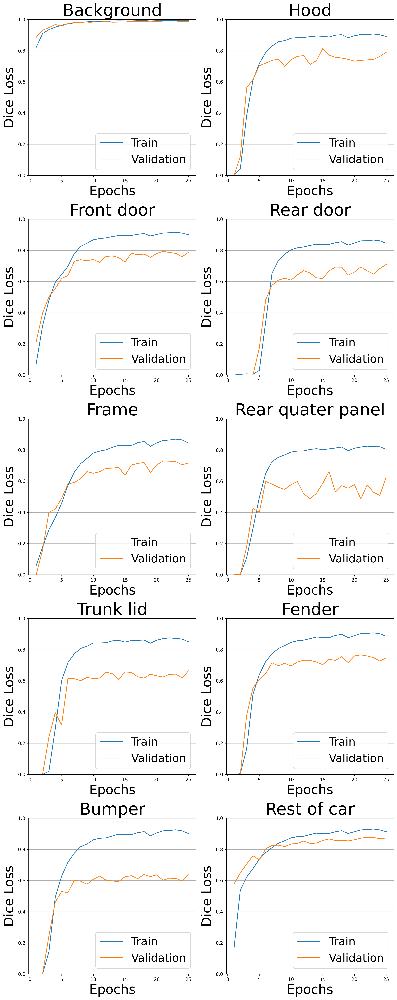

In [34]:

model_folder_path = '/content/drive/My Drive/Skoli/6H/Deep Learning/Final Project/models_final/Bi_tempered_t1'
car_parts_names = ["Background", "Hood", "Front door", "Rear door", "Frame", "Rear quater panel", "Trunk lid", "Fender", "Bumper", "Rest of car"]

num_classes = 10
plots_per_row = 2

mult = 2

title_fontsize = 18*2
label_fontsize = 14*2
legend_fontsize = 12*2

num_rows = (num_classes + plots_per_row - 1) // plots_per_row
fig, axes = plt.subplots(num_rows, plots_per_row, figsize=(12, 6 * num_rows), dpi=300)

for i in range(num_classes):
    row = i // plots_per_row
    col = i % plots_per_row
    ax = axes[row, col]
    ax.plot(range(1, 26), dice_loss_train_store[:25, i], label='Train')
    ax.plot(range(1, 26), dice_loss_validation_store[:25, i], label='Validation')
    ax.set_title(f'{car_parts_names[i]}', fontsize=title_fontsize)
    ax.set_xlabel('Epochs', fontsize=label_fontsize)
    ax.set_ylabel('Dice Loss', fontsize=label_fontsize)
    ax.legend(fontsize=legend_fontsize)


    ax.yaxis.grid(True)
    ax.set_ylim(0,1)
    ax.legend(fontsize=legend_fontsize, loc='lower right')

if num_classes % plots_per_row != 0:
    for i in range(num_classes, num_rows * plots_per_row):
        fig.delaxes(axes[i // plots_per_row, i % plots_per_row])

plt.tight_layout()

save_path = os.path.join(model_folder_path, 'dice_epoch.png')
plt.savefig(save_path, dpi=300, bbox_inches='tight')

plt.show()


## Results

Train:


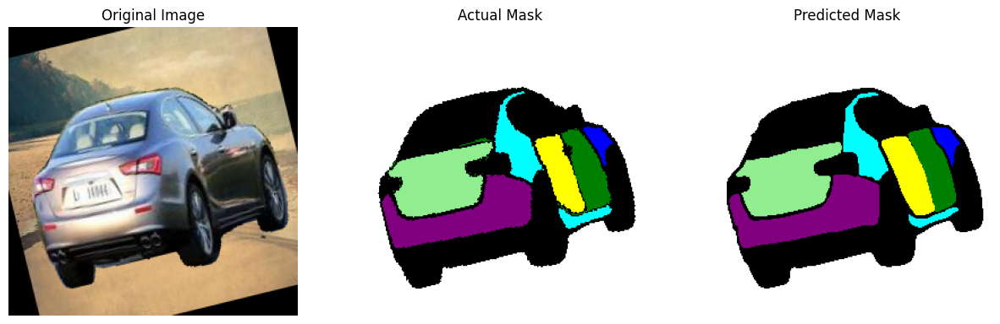

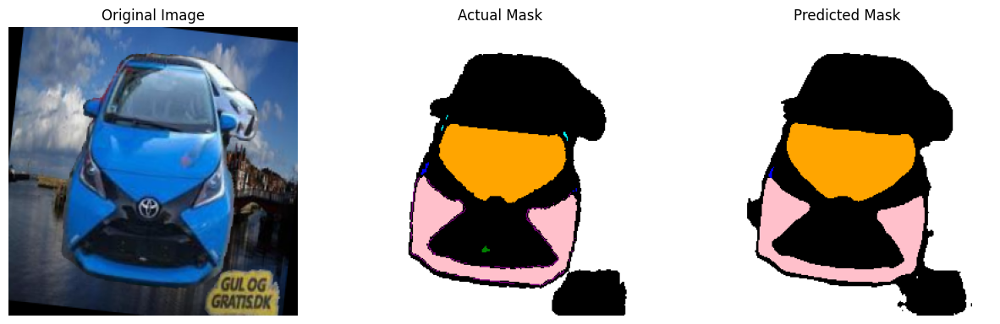

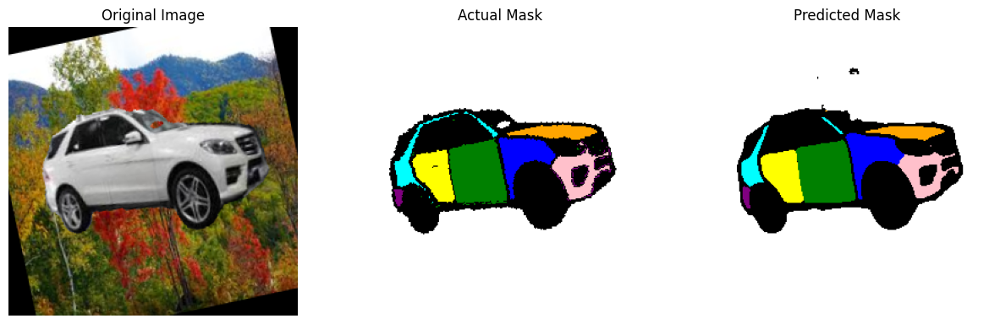

Validation:


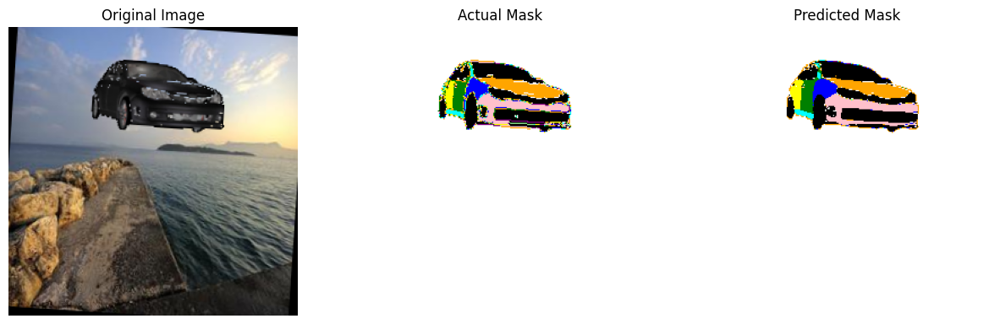

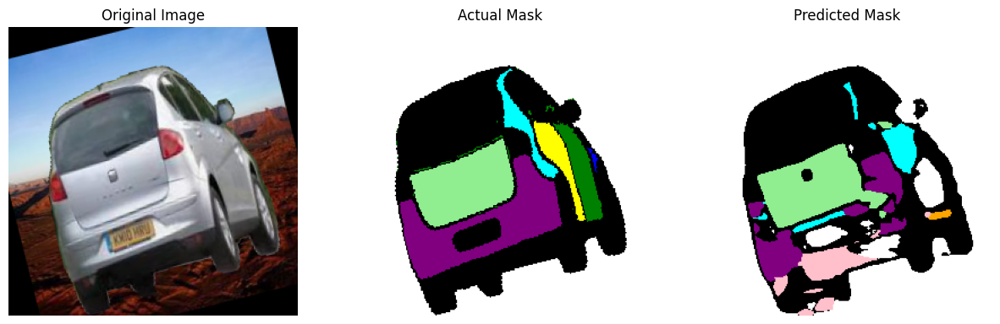

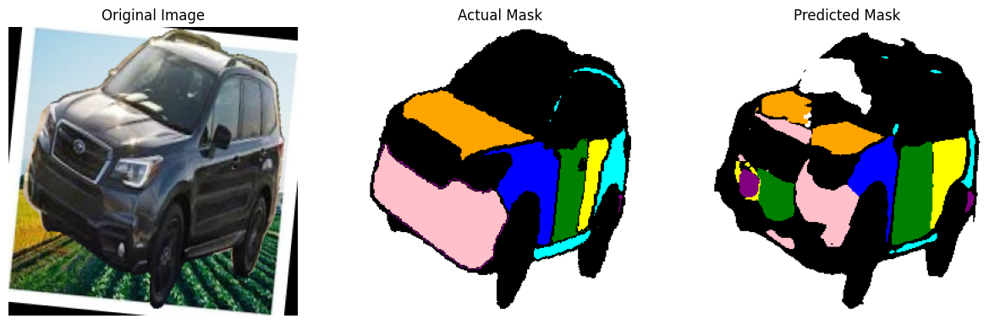

Test:


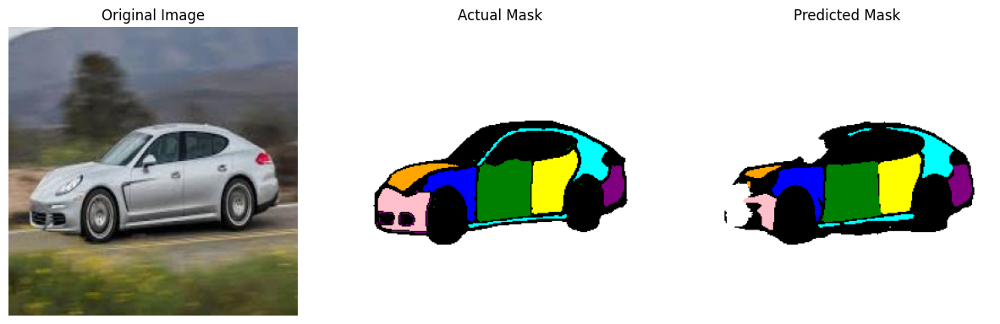

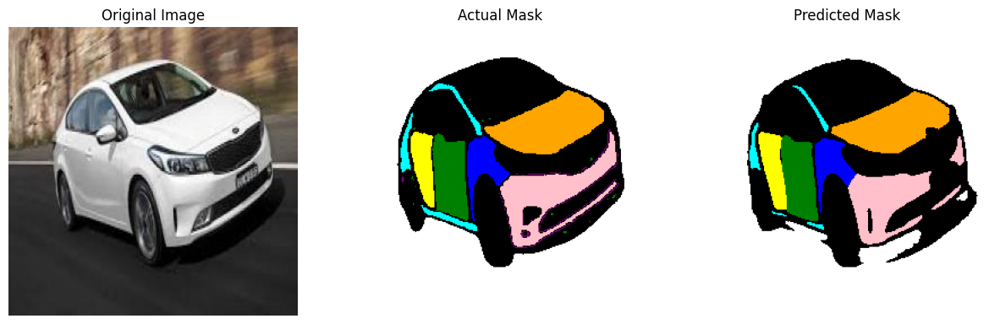

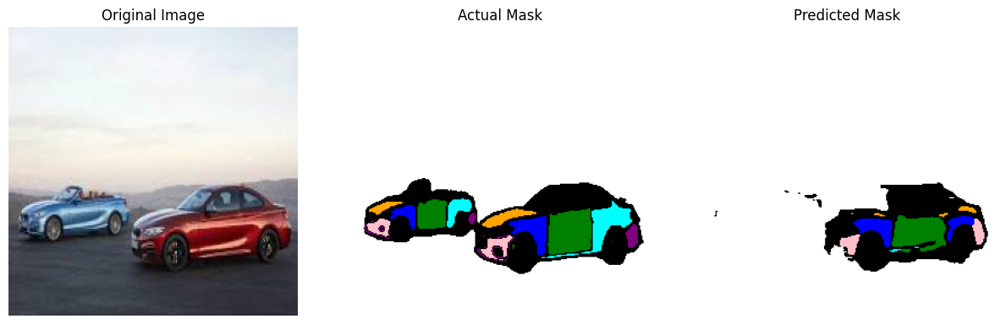

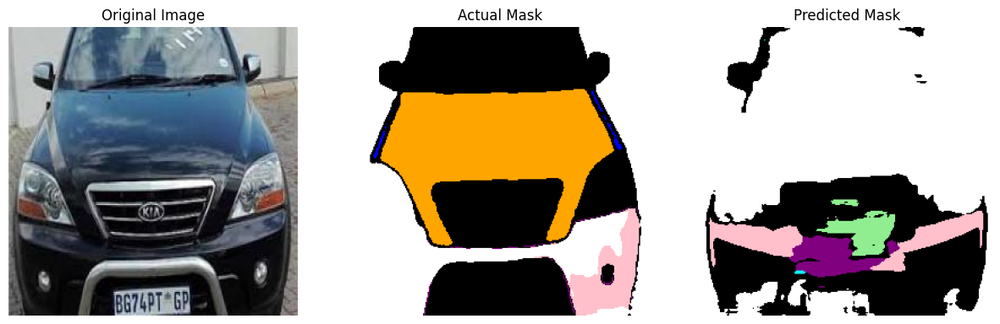

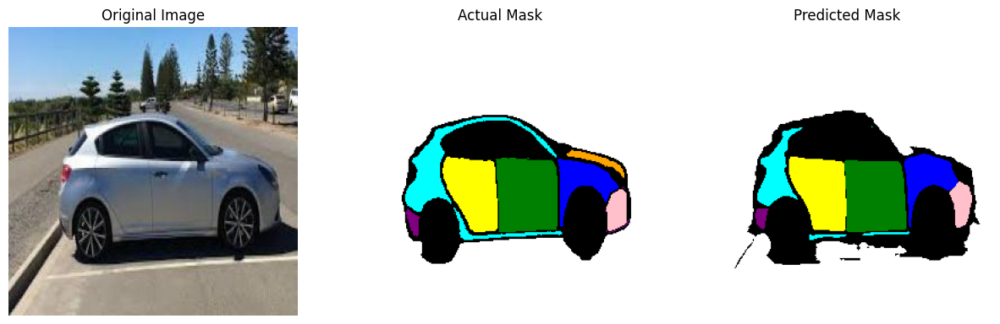

...

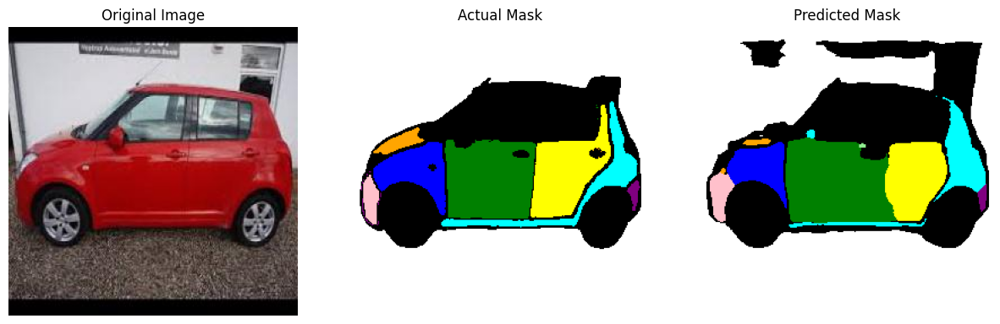

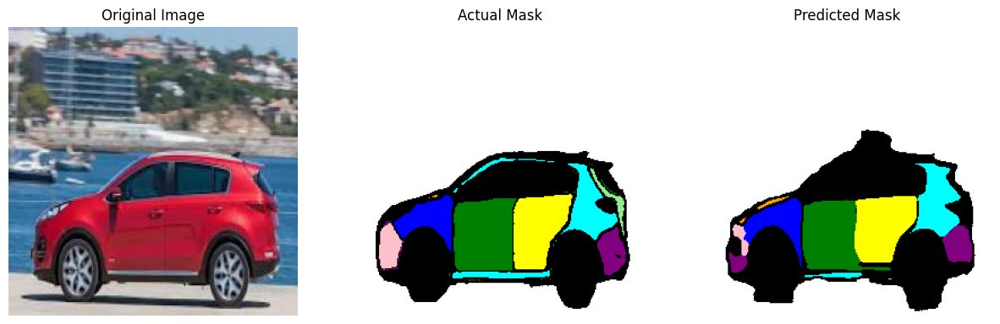

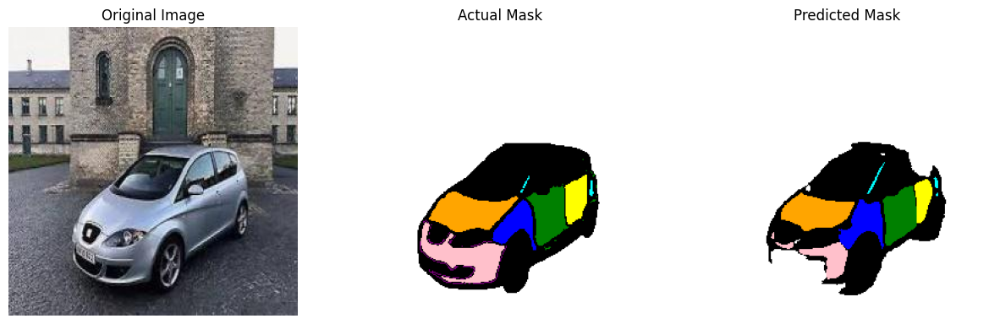

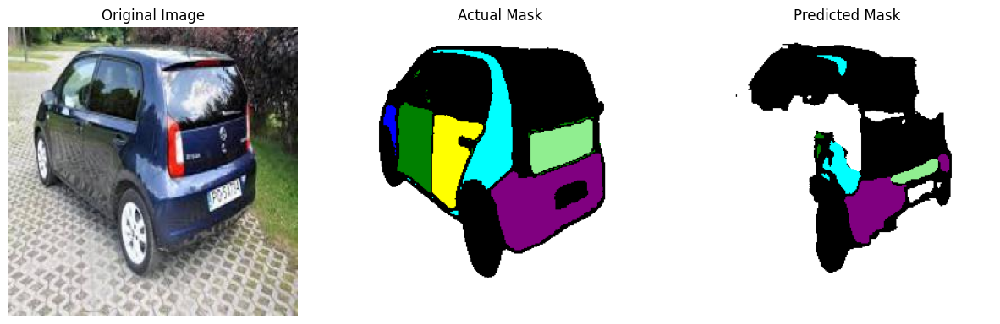

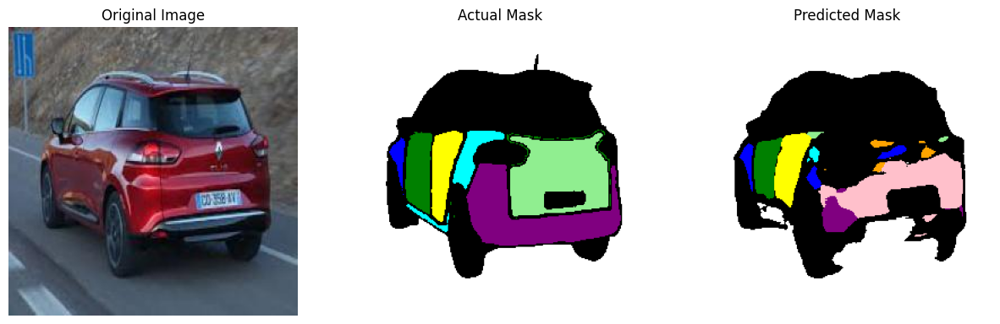

In [20]:
## Visualize results

def visualize_results(images, masks, num_examples):
    # Compares visually 'num_examples' of images with the actual and predicted mask

    # Predict masks with the model
    model.eval()
    with torch.no_grad():
        preds = model(images)

    # Take the argmax to get the class label for each pixel
    pred_masks = preds.argmax(dim=1)

    for i in range(num_examples if num_examples < batch_size else batch_size):
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))

        # Original image
        img = images[i].detach().cpu().permute((1, 2, 0)).numpy()   #.astype(int)
        cmap = 'gray' if grayscale else None
        ax1.imshow(img, cmap=cmap)
        ax1.set_title('Original Image')
        ax1.axis('off')

        # Actual mask
        true_mask = segment_image(images[i], masks[i]).permute((1, 2, 0)).long()
        ax2.imshow(true_mask)
        ax2.set_title('Actual Mask')
        ax2.axis('off')

        # Predicted mask
        pred_mask = segment_image(images[i], pred_masks[i]).permute((1, 2, 0)).long()
        ax3.imshow(pred_mask)
        ax3.set_title('Predicted Mask')
        ax3.axis('off')

        plt.show()


# Get a batch of images and masks from the dataloader
print('Train:')
images, masks = next(iter(train_dataloader))
images, masks = images.to(device), masks.to(device)
visualize_results(images, masks, num_examples=3)

print('Validation:')
images, masks = next(iter(validation_dataloader))
images, masks = images.to(device), masks.to(device)
visualize_results(images, masks, num_examples=3)

print('Test:')
images, masks = next(iter(test_dataloader))
images, masks = images.to(device), masks.to(device)
visualize_results(images, masks, num_examples=30)

In [21]:
## Evaluate test set - dice scores and confusion matrix

def calculate_accuracy(y_true, y_pred):
    accuracy = accuracy_score(y_true.flatten().detach().cpu().numpy(), y_pred.flatten().detach().cpu().numpy())
    return accuracy


def compute_confusion_matrix(target, pred, normalize=None):
    return metrics.confusion_matrix(
        target.flatten().detach().cpu().numpy(),
        pred.flatten().detach().cpu().numpy(),
        normalize=normalize,
        labels=np.arange(num_classes)
    )


def normalize(matrix, axis):
    axis = {'true': 1, 'pred': 0}[axis]
    return matrix / matrix.sum(axis=axis, keepdims=True)


In [22]:
confusion_matrix = np.zeros((num_classes, num_classes))
with torch.no_grad():
    model.eval()
    test_accuracies = []
    test_dice_scores = np.zeros(num_classes)
    for images, masks in test_dataloader:
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)
        predictions = outputs.max(1)[1]

        # Multiply by len(inputs) because the final batch of DataLoader may be smaller
        test_accuracies.append(calculate_accuracy(masks, predictions) * len(images))
        dice_scores = dice_coefficient(outputs.argmax(dim=1), masks, num_classes)
        test_dice_scores += np.nan_to_num(dice_scores)*len(images)

        ccm = compute_confusion_matrix(masks, predictions)
        confusion_matrix += ccm

    test_accuracy = np.sum(test_accuracies) / len(test_dataloader.dataset)
    avg_dice_scores_test = test_dice_scores / len(test_dataloader.dataset)

    model.train()

In [23]:
print('Dice for each class:', avg_dice_scores_test)
print('Average Dice for car parts (8 classes):', np.mean(avg_dice_scores_test[1:-1]))
print('Average Dice for all classes (10 classes):', np.mean(avg_dice_scores_test))
print('Accuracy:', test_accuracy)

Dice for each class: [0.94069749 0.59869093 0.81473547 0.76100093 0.54441983 0.46977848
 0.55011058 0.76236886 0.66094524 0.78240287]
Average Dice for car parts (8 classes): 0.6452562883496284
Average Dice for all classes (10 classes): 0.6885150671005249
Accuracy: 0.8637130737304688


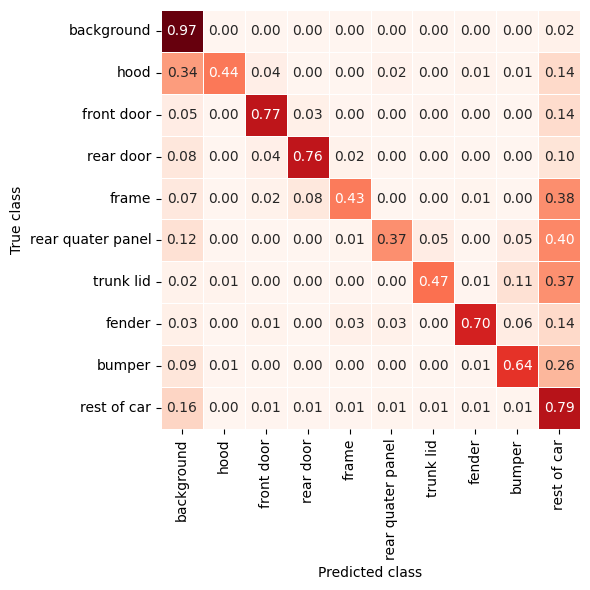

In [24]:
x_labels = car_parts
y_labels = x_labels
plt.figure(figsize=(6, 6))
sns.heatmap(
    ax=plt.gca(),
    data=normalize(confusion_matrix, 'true'),
    annot=True,
    linewidths=0.5,
    cmap="Reds",
    cbar=False,
    fmt=".2f",
    xticklabels=x_labels,
    yticklabels=y_labels,
)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.ylabel("True class")
plt.xlabel("Predicted class")
plt.tight_layout()
plt.show()